In [1]:
%matplotlib ipympl
import pandas as pd
import numpy as np
import matplotlib.pylab as plt

from scipy import stats
from statsmodels.stats.multicomp import (pairwise_tukeyhsd,
                                         MultiComparison)

from matplotlib.backends.backend_pdf import PdfPages

# What happens when you have a continous variable and lots of categorigal data describing it.  
(remember categorical is descriptive e.g. state or zipcode)

## This is groupby

## Flashback.  Remeber how you can do a boxplot with a column= and by=   We are going to explore that more.  

We are going to go for a big dataset.  The NYC tree census from 2015.  
- The summary is here https://www.nycgovparks.org/trees/treescount
- The data is at the NYC Open Data portal here https://data.cityofnewyork.us/Environment/2015-Street-Tree-Census-Tree-Data/uvpi-gqnh/about_data  I also have it on github so maybe can downolad easier.  
- Click on export and then csv
- get it into your working directory.  
- Then they also have a data dictionary that descirbes the data.  It is under about and linked here. https://data.cityofnewyork.us/api/views/uvpi-gqnh/files/8705bfd6-993c-40c5-8620-0c81191c7e25?download=true&filename=StreetTreeCensus2015TreesDataDictionary20161102.pdf   These are very helpful.
- Do not try to open the data in excel.  It is a big file and will bog down your computer.  Just read it in.
- I have to do one bit of crazy reading in
    - For some parameters the answer is None.  For example there are not guards and it lists none.
    - this causes pandas problems.  It thinks none is NaN.  
    - You have to tell it that only blanks are NaN's.  

In [2]:
df=pd.read_csv('2015_Street_Tree_Census_-_Tree_Data_20250411.csv',na_values='',keep_default_na=False)

In [3]:
df.columns

Index(['tree_id', 'block_id', 'created_at', 'tree_dbh', 'stump_diam',
       'curb_loc', 'status', 'health', 'spc_latin', 'spc_common', 'steward',
       'guards', 'sidewalk', 'user_type', 'problems', 'root_stone',
       'root_grate', 'root_other', 'trunk_wire', 'trnk_light', 'trnk_other',
       'brch_light', 'brch_shoe', 'brch_other', 'address', 'postcode',
       'zip_city', 'community board', 'borocode', 'borough', 'cncldist',
       'st_assem', 'st_senate', 'nta', 'nta_name', 'boro_ct', 'state',
       'latitude', 'longitude', 'x_sp', 'y_sp', 'council district',
       'census tract', 'bin', 'bbl'],
      dtype='object')

In [4]:
#df

In [5]:
df.describe()

,tree_id,block_id,tree_dbh,stump_diam,postcode,community board,borocode,cncldist,st_assem,st_senate,boro_ct,latitude,longitude,x_sp,y_sp,council district,census tract,bin,bbl
count,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,683788.000000,6.837880e+05,683788.000000,683788.000000,6.837880e+05,683788.000000,677269.000000,677269.000000,6.742290e+05,6.742290e+05
mean,365205.011085,313793.096236,11.279787,0.432463,10916.246044,343.505404,3.358500,29.943181,50.791583,20.615781,3.404914e+06,40.701261,-73.924060,1.005280e+06,194798.424625,30.027330,11957.368422,3.495439e+06,3.413414e+09
std,208122.092902,114839.024312,8.723042,3.290241,651.553364,115.740601,1.166746,14.328531,18.966520,7.390844,1.175863e+06,0.090311,0.123583,3.428505e+04,32902.061114,14.301717,30745.739811,1.193275e+06,1.174892e+09
min,3.000000,100002.000000,0.000000,0.000000,83.000000,101.000000,1.000000,1.000000,23.000000,10.000000,1.000201e+06,40.498466,-74.254965,9.133493e+05,120973.792200,1.000000,1.000000,1.000000e+06,0.000000e+00
25%,186582.750000,221556.000000,4.000000,0.000000,10451.000000,302.000000,3.000000,19.000000,33.000000,14.000000,3.011700e+06,40.631928,-73.980500,9.896578e+05,169515.153700,19.000000,202.000000,3.031991e+06,3.011240e+09
50%,366214.500000,319967.000000,9.000000,0.000000,11214.000000,402.000000,4.000000,30.000000,52.000000,21.000000,4.008100e+06,40.700612,-73.912911,1.008386e+06,194560.252500,30.000000,516.000000,4.020352e+06,4.008560e+09
75%,546170.250000,404624.000000,16.000000,0.000000,11365.000000,412.000000,4.000000,43.000000,64.000000,25.000000,4.103202e+06,40.762228,-73.834910,1.029991e+06,217019.571950,43.000000,1417.000000,4.263123e+06,4.105700e+09
max,722694.000000,999999.000000,450.000000,140.000000,11697.000000,503.000000,5.000000,51.000000,87.000000,36.000000,5.032300e+06,40.912918,-73.700488,1.067248e+06,271894.092100,51.000000,157903.000000,5.515124e+06,5.080500e+09


## Tree size
- We are interested in tree size.
- this is dbh which is diameter at breast height
- let's start by just describing that data

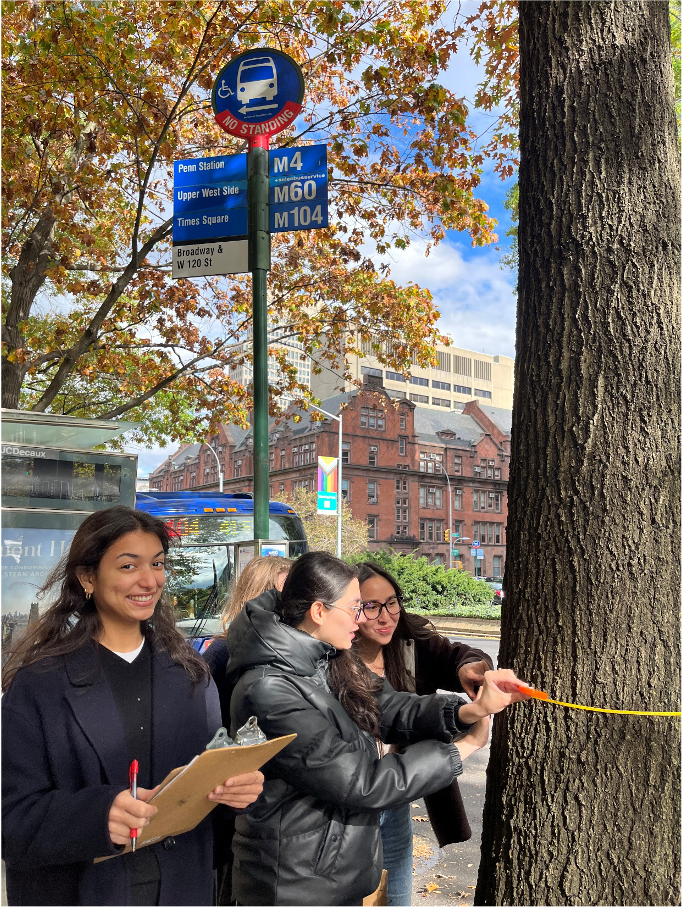

In [6]:
from IPython.display import Image
Image('DBH_students.png',width=400)

In [7]:
df['tree_dbh'].describe()

count    683788.000000
mean         11.279787
std           8.723042
min           0.000000
25%           4.000000
50%           9.000000
75%          16.000000
max         450.000000
Name: tree_dbh, dtype: float64

### Make a box plot
- Want DBH seperated by borough
- first lets use_value_counts to see how many trees in each borough

In [8]:
df['borough'].value_counts()

borough
Queens           250551
Brooklyn         177293
Staten Island    105318
Bronx             85203
Manhattan         65423
Name: count, dtype: int64

What if you want to percent of trees in each borough?
- Just divide by the total count
- multiply by 100

In [9]:
df['borough'].value_counts()/df['borough'].count()*100

borough
Queens           36.641620
Brooklyn         25.928065
Staten Island    15.402142
Bronx            12.460441
Manhattan         9.567732
Name: count, dtype: float64

You can also value_count by multiple columns.  Here I am asking how much stewardship

But this is hard to read.  We will do it better.  

In [10]:
df[['borough','steward']].value_counts()

borough        steward
Queens         None       192701
Brooklyn       None       119284
Staten Island  None        81106
Bronx          None        64851
Brooklyn       1or2        43877
Queens         1or2        41868
Manhattan      None        29881
               1or2        24175
Staten Island  1or2        18829
Bronx          1or2        14808
Manhattan      3or4         7817
Brooklyn       3or4         6050
Queens         3or4         3065
Staten Island  3or4         1396
Bronx          3or4          855
Manhattan      4orMore       554
Brooklyn       4orMore       533
Queens         4orMore       340
Staten Island  4orMore       112
Bronx          4orMore        71
Name: count, dtype: int64

Now make your boxplot of DBH by borogugh

<Axes: title={'center': 'tree_dbh'}, xlabel='borough'>

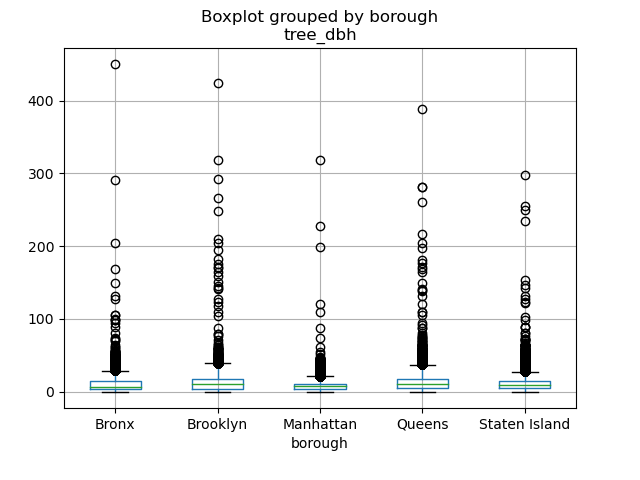

In [11]:
fig,ax=plt.subplots()
df.boxplot(column='tree_dbh',by='borough',ax=ax)

### The outliers ruin it.
- add a kwarg, keyword arugment 
- showfliers=False

<Axes: title={'center': 'tree_dbh'}, xlabel='borough'>

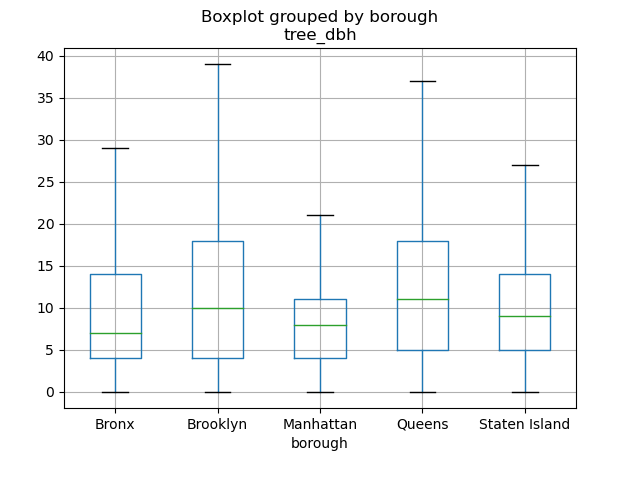

In [12]:
fig,ax=plt.subplots()
df.boxplot(column='tree_dbh',by='borough',ax=ax,showfliers=False)

## Now what if we actually want the data.  
- use the groupby function
- https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.groupby.html
- Here is how it works
    - Choose your columns you want to analyze
    - Choose the column you want to groupby
    - choose how you want to aggregate https://stackoverflow.com/questions/53943319/what-are-all-pandas-agg-functions
- Example
    - want to analyze DBH
    - Want to groupby borough
    - want to aggregate by mean. 


In [23]:
df.groupby(by=['borough'])['tree_dbh'].mean()

borough
Bronx             9.693649
Brooklyn         11.738884
Manhattan         8.473641
Queens           12.557870
Staten Island    10.492746
Name: tree_dbh, dtype: float64

You can do mor than just mean.  You can even make your own functions.  Use describe to get all the parameters

In [24]:
df.groupby(by=['borough'])['tree_dbh'].describe()

,count,mean,std,min,25%,50%,75%,max
borough,,,,,,,,
Bronx,85203.0,9.693649,7.919802,0.0,4.0,7.0,14.0,450.0
Brooklyn,177293.0,11.738884,9.071056,0.0,4.0,10.0,18.0,425.0
Manhattan,65423.0,8.473641,5.658584,0.0,4.0,8.0,11.0,318.0
Queens,250551.0,12.557870,9.352517,0.0,5.0,11.0,18.0,389.0
Staten Island,105318.0,10.492746,8.062614,0.0,5.0,9.0,14.0,298.0


Now you can sort by the mean biggest to smallest

In [25]:
df.groupby(by=['borough'])['tree_dbh'].describe().sort_values(by='mean',ascending=False)

,count,mean,std,min,25%,50%,75%,max
borough,,,,,,,,
Queens,250551.0,12.557870,9.352517,0.0,5.0,11.0,18.0,389.0
Brooklyn,177293.0,11.738884,9.071056,0.0,4.0,10.0,18.0,425.0
Staten Island,105318.0,10.492746,8.062614,0.0,5.0,9.0,14.0,298.0
Bronx,85203.0,9.693649,7.919802,0.0,4.0,7.0,14.0,450.0
Manhattan,65423.0,8.473641,5.658584,0.0,4.0,8.0,11.0,318.0


Now what are the most popular trees?

In [26]:
df['spc_common'].value_counts()

spc_common
London planetree    87014
honeylocust         64264
Callery pear        58931
pin oak             53185
Norway maple        34189
                    ...  
black pine             37
pitch pine             33
Osage-orange           29
Scots pine             25
Virginia pine          10
Name: count, Length: 132, dtype: int64

What are the percentages of each tree?

In [27]:
df['spc_common'].value_counts()/df['spc_common'].count()*100

spc_common
London planetree    13.342247
honeylocust          9.853888
Callery pear         9.036155
pin oak              8.155095
Norway maple         5.242353
                      ...    
black pine           0.005673
pitch pine           0.005060
Osage-orange         0.004447
Scots pine           0.003833
Virginia pine        0.001533
Name: count, Length: 132, dtype: float64

You can easily turn this into a plot of the percentage of the top 10 trees

<Axes: xlabel='spc_common'>

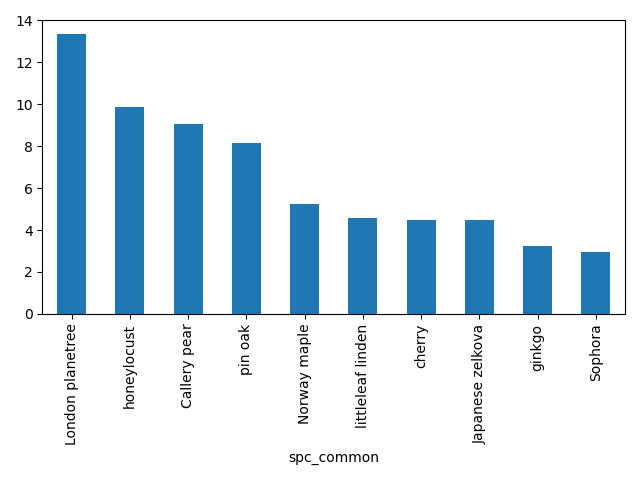

In [15]:
fig,ax=plt.subplots(layout='tight')
(df['spc_common'].value_counts()/df['spc_common'].count()*100)[0:10].plot.bar(ax=ax)

Don't do this next graph.  I got bored and wanted to include cummulative sum on a second axis

Text(0, 0.5, 'Cummulativve Percentage')

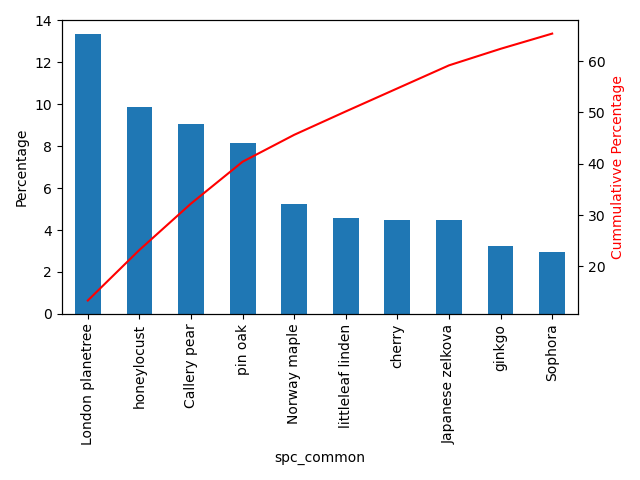

In [35]:
fig,ax=plt.subplots(layout='tight')
df_plot=(df['spc_common'].value_counts()/df['spc_common'].count()*100)
df_plot[0:10].plot.bar(ax=ax)
ax2=ax.twinx()
ax2.plot(np.arange(10), df_plot[0:10].cumsum(), color='red')
ax.set_ylabel('Percentage')
ax2.set_ylabel('Cummulativve Percentage',color='red')

What are the biggest tree species?

In [36]:
df.groupby(by=['spc_common'])['tree_dbh'].mean().sort_values(ascending=False)

spc_common
London planetree      21.560657
silver maple          21.013603
eastern cottonwood    17.061594
pin oak               16.867707
weeping willow        15.797872
                        ...    
paperbark maple        3.509091
false cypress          3.453704
Japanese snowbell      3.382653
Persian ironwood       3.202166
pond cypress           3.022099
Name: tree_dbh, Length: 132, dtype: float64

Since it doesn't show them all just put them all into an excel file

In [37]:
df.groupby(by=['spc_common'])['tree_dbh'].describe().sort_values(by='mean',ascending=False).to_excel('tree_dbh.xlsx')

Now just go look at the excel file!

i am interested in tree guards

In [38]:
df['guards'].value_counts()

guards
None       572306
Helpful     51866
Harmful     20252
Unsure       7748
Name: count, dtype: int64

In [39]:
df['guards'].value_counts()/df['guards'].count()*100

guards
None       87.753844
Helpful     7.952810
Harmful     3.105316
Unsure      1.188030
Name: count, dtype: float64

Do we have a lot have missing data?  We can count the nan for the missing data

In [40]:
df['guards'].value_counts(dropna=False)

guards
None       572306
Helpful     51866
NaN         31616
Harmful     20252
Unsure       7748
Name: count, dtype: int64

Now to get the percentage since we are including NaN and this all rows we can just divide by the number of rows or this the shape.  

In [41]:
df['guards'].value_counts(dropna=False)/df.shape[0]*100

guards
None       83.696409
Helpful     7.585099
NaN         4.623655
Harmful     2.961737
Unsure      1.133100
Name: count, dtype: float64

Questions
- Do helpful guards increase the mean DBH?
- Which borough has the most guards?
- Which borough has the highest percentage of trees guarded?

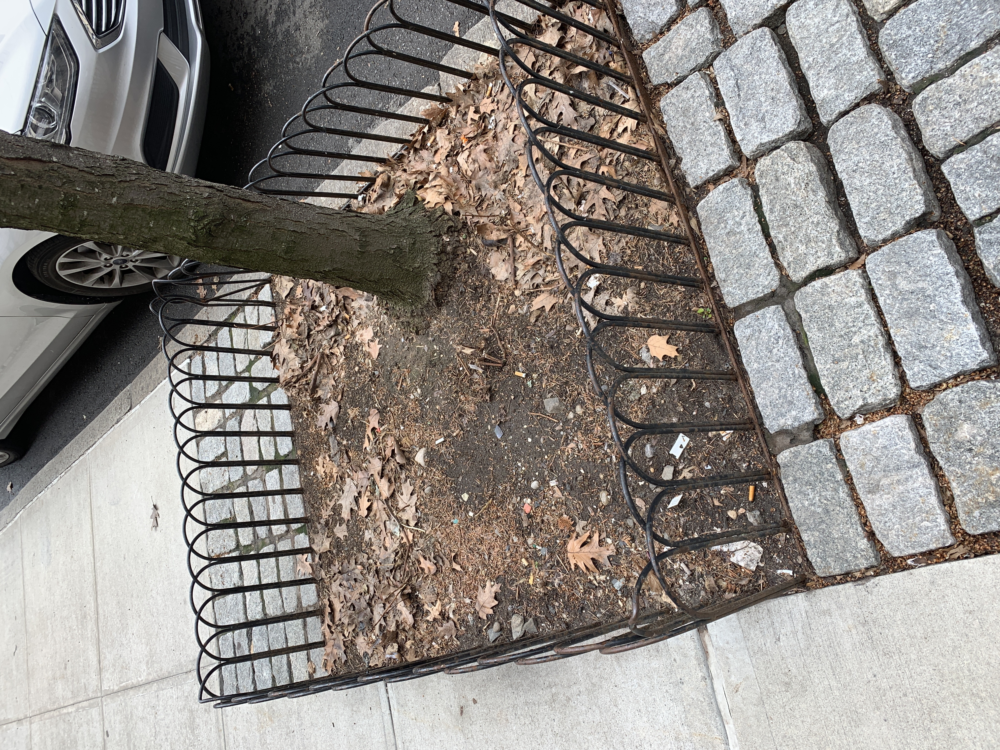

In [42]:
Image('guards.jpg',width=400)

In [43]:
df.groupby(by=['guards'])['tree_dbh'].describe()

,count,mean,std,min,25%,50%,75%,max
guards,,,,,,,,
Harmful,20252.0,10.583646,6.080190,0.0,6.0,10.0,13.0,170.0
Helpful,51866.0,8.537886,6.267371,0.0,4.0,7.0,11.0,159.0
None,572306.0,12.058201,8.851880,0.0,5.0,10.0,17.0,425.0
Unsure,7748.0,10.125452,6.757314,0.0,5.0,9.0,13.0,53.0


Trees with no guards are the biggest?  Weird....  Maybe they only put guards around young or recent trees???  Maybe just around trees in higher traffic areas?  Not much difference between helpful or harmful guards.

Now guards by borough

In [44]:
df.groupby(by=['borough','guards'])['guards'].count()

borough        guards 
Bronx          Harmful       976
               Helpful      4605
               None        74524
               Unsure        480
Brooklyn       Harmful      5650
               Helpful     19471
               None       142563
               Unsure       2060
Manhattan      Harmful      8741
               Helpful     17559
               None        34812
               Unsure       1315
Queens         Harmful      3690
               Helpful      7153
               None       224356
               Unsure       2774
Staten Island  Harmful      1195
               Helpful      3078
               None        96051
               Unsure       1119
Name: guards, dtype: int64

Okay.  Lets convert this to a percent and see what borough has the biggest percent of guards

In [45]:
df.groupby(by=['borough','guards'])['guards'].count()/df['guards'].count()*100

borough        guards 
Bronx          Harmful     0.149654
               Helpful     0.706102
               None       11.427047
               Unsure      0.073600
Brooklyn       Harmful     0.866336
               Helpful     2.985562
               None       21.859724
               Unsure      0.315868
Manhattan      Harmful     1.340291
               Helpful     2.692388
               None        5.337856
               Unsure      0.201634
Queens         Harmful     0.565802
               Helpful     1.096797
               None       34.401354
               Unsure      0.425348
Staten Island  Harmful     0.183234
               Helpful     0.471961
               None       14.727863
               Unsure      0.171581
Name: guards, dtype: float64

so you can see that most of the helpful guards are in Manhattan and Brooklyn.  Probably the richer neighborhoods......
Now which borough has the highest % of helpful guards

Now this is hard: follow me
- We just got the overall % of where he guards are helpful
- We can also get the percent by borough
- Instead of dividing by all guards you divide by the guards in each boroguh

In [46]:
df.groupby(by=['borough','guards'])['guards'].count()\
        /df.groupby(by=['borough'])['guards'].count()*100

borough        guards 
Bronx          Harmful     1.211144
               Helpful     5.714463
               None       92.478749
               Unsure      0.595644
Brooklyn       Harmful     3.328542
               Helpful    11.470803
               None       83.987063
               Unsure      1.213592
Manhattan      Harmful    14.001954
               Helpful    28.127253
               None       55.764333
               Unsure      2.106460
Queens         Harmful     1.550596
               Helpful     3.005803
               None       94.277922
               Unsure      1.165678
Staten Island  Harmful     1.178001
               Helpful     3.034216
               None       94.684700
               Unsure      1.103083
Name: guards, dtype: float64

You can see that Manhattan has by Far the highest percentage of guarded trees

# HW
- Read in the uni_assignment.xlsx file
- set index to uni
- look up your uni and see which property/parameter you will analyze
- For your property
    - Look up what it is in the data dictionary and write a short description
    - report a count of the breakdown of your parameter
    - convert the count to a percentage
    - use describe to realate how your parameters relate to dbh
    - make a boxplot of dbh split by your parameter
    - summarize what you found
    - compare the counts your parameter across boroughs
    - convert to a total percentage across all boroughs
    - convert to a percentage by borough (don't forget about NaN's)
    - summaruze what you find. 
- Think of/write down another time or with another type of data where you could see this methoddolgy comeing in useful.  
- First Final 5%.  Insert a picture of a street tree you find interesting.  Does it connect to your parameter?
- Second Final 5%.  Calculate a t-test or anova for your data to see if the differences in dbh are statistically significant.  
    


## Second Final 5%

Pandas does not make it easy to do a t-test and anova.  Not sure why.  Perform either a t-testor anova on your data

t-test
- two parameters!!!!
- is there a statistical difference.  
- I am not going into the details.  You can read and learn about t-tests
- This is the easiest way I found to do it.
  - I state which columns I want for datat and grouping
  - Then you can use groupby to rearrange the data.  
  - This is where it gets funky.  The lambda fucntion puts them in seperate lists
  - Then the * passes them correctly
  - I can not find a good write up on how the * works (working on it)
  - The p-value tells you the significanes.  


In [45]:
col_for_data='tree_dbh'
col_to_group='root_other'
stats.ttest_ind(*df.groupby(col_to_group)[col_for_data].apply(lambda x:x.values))


Ttest_indResult(statistic=-63.79608098894526, pvalue=0.0)

## Anova
If you want to see if the differences between the groups is significant you do an anova.  If it is two groups you do a t-test.  If it is more than two groups you do an Anova.  
- One-way anova tells you if there is a signgicant difference among groups.
- it does not tell you which groups.  
- Again it is the p-value we want!
- I can't explain this code very well but it is slick and works.  
- The stats.f_oneway needs a numpy array.  so you use groupby to make the arrays.  Then make seperate columns
- then you run the stats.
- Then I pring the stats
- This is the format samples = [cols[1] for cols in df.groupby(col_to_group)[col_for_data]] 

In [65]:
col_for_data='tree_dbh'
col_to_group='borough'
 
f_val, p_val = stats.f_oneway(*df.groupby(col_to_group)[col_for_data].apply(lambda x:x.values)) 
print('F value: {:.3f}, p value: {:.3f}\n'.format(f_val, p_val))


F value: 4178.336, p value: 0.000



In [66]:
col_for_data='tree_dbh'
col_to_group='borough'
mod = MultiComparison(df[col_for_data], df[col_to_group])
    
print(mod.tukeyhsd())

     Multiple Comparison of Means - Tukey HSD, FWER=0.05     
  group1      group2    meandiff p-adj  lower   upper  reject
-------------------------------------------------------------
    Bronx      Brooklyn   2.0452   0.0  1.9472  2.1432   True
    Bronx     Manhattan    -1.22   0.0 -1.3422 -1.0978   True
    Bronx        Queens   2.8642   0.0   2.771  2.9575   True
    Bronx Staten Island   0.7991   0.0  0.6908  0.9074   True
 Brooklyn     Manhattan  -3.2652   0.0 -3.3728 -3.1577   True
 Brooklyn        Queens    0.819   0.0   0.746  0.8919   True
 Brooklyn Staten Island  -1.2461   0.0 -1.3376 -1.1547   True
Manhattan        Queens   4.0842   0.0   3.981  4.1874   True
Manhattan Staten Island   2.0191   0.0  1.9021  2.1361   True
   Queens Staten Island  -2.0651   0.0 -2.1515 -1.9788   True
-------------------------------------------------------------


### The results tell you which one is different.  R does this better and automatically shows it on a graph.
-  But True means you reject the null hypothesis. 
-  meandiff tells you the difference in the means between groups.
-  p-adj tells you the p-value of that meandiff.  so if it is significant
-  lower and upper gives the 95% confidence range of the meandiff
-  reject tells us if we can reject the null hypothesis.  So if p-adj<0.05 it is True

# Answers

<Axes: title={'center': 'tree_dbh'}, xlabel='borough'>

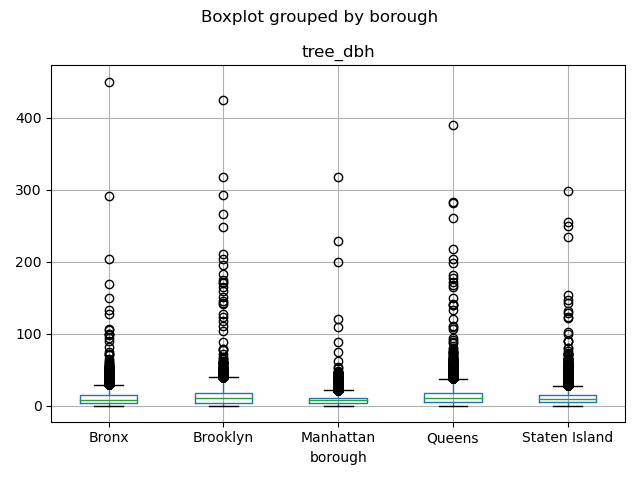

In [17]:
fig,ax=plt.subplots(layout='tight')
df.boxplot(column='tree_dbh',by='borough',ax=ax)

<Axes: title={'center': 'tree_dbh'}, xlabel='borough'>

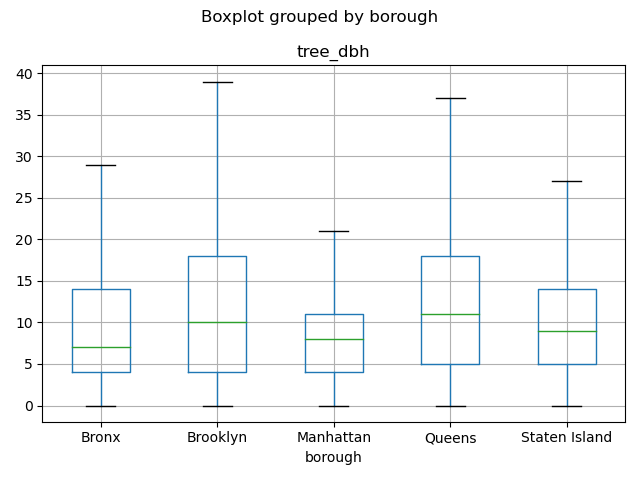

In [18]:
fig,ax=plt.subplots(layout='tight')
df.boxplot(column='tree_dbh',by='borough',ax=ax,showfliers=False)

/var/folders/dw/0b9k7c_s7nj6fspmx6n2gbk40000gp/T/ipykernel_16811/1545348015.py:1: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig,ax=plt.subplots(layout='tight')


Text(0.5, 0, '')

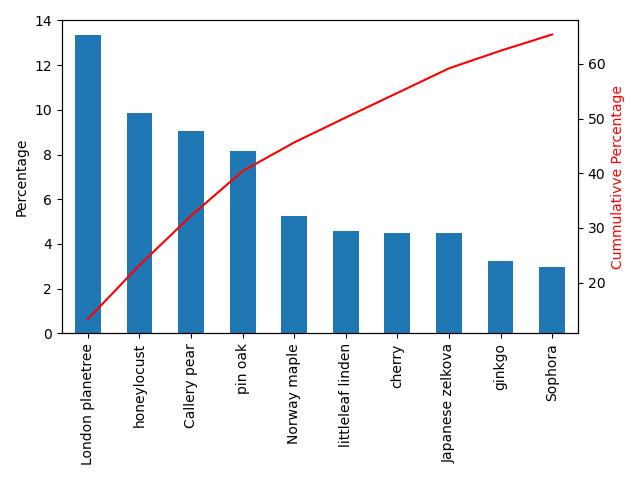

In [34]:
fig,ax=plt.subplots(layout='tight')
df_plot=(df['spc_common'].value_counts()/df['spc_common'].count()*100)
df_plot[0:10].plot.bar(ax=ax)
ax2=ax.twinx()
ax2.plot(np.arange(10), df_plot[0:10].cumsum(), color='red')
ax.set_ylabel('Percentage')
ax2.set_ylabel('Cummulativve Percentage',color='red')
ax.set_xlabel(None)

#### IGNORE BELOW THIS

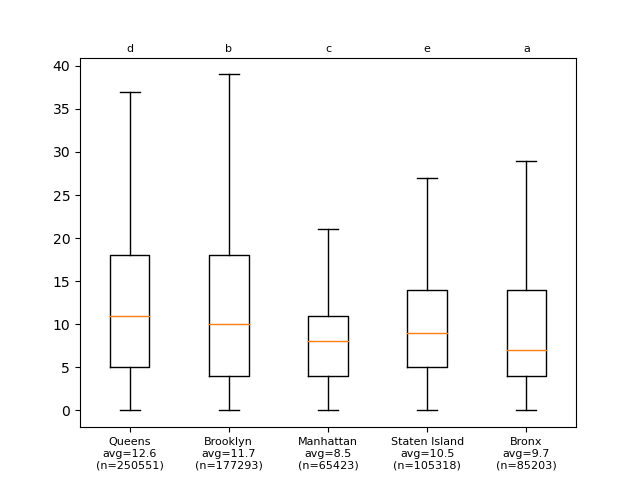

In [21]:
col_for_data='tree_dbh'
col_to_group='borough'

fig,ax=plt.subplots()

plot_anova_methane_jitter_simple(df,col_to_group=col_to_group,col_for_data=col_for_data
                                 ,namelist=df[col_to_group].unique()
          ,closefig=False,ax=ax,fig=fig,fontsize=8)

In [20]:
# © Copyright 2022 Brian Mailloux
from statsmodels.stats.multicomp import (pairwise_tukeyhsd,
                                         MultiComparison)

def plot_anova_methane_jitter_simple(df,col_to_group,col_for_data,namelist
                                     ,closefig=True,ax=None,fig=None,fontsize=10,ax_title=None,ylabel=None):
    '''this makes a boxplot with scatters and then add's the anova letters based on Has-Peter Piepho (2004)
    Hans-Peter Piepho (2004) An Algorithm for a Letter-Based Representation of All-Pairwise Comparisons
            , Journal of Computational and Graphical Statistics, 13:2, 456-466, DOI: 10.1198/1061860043515
   '''
    
    df['jitter']=np.random.uniform(-0.1,0.1,size=df.shape[0])
    if not 'facecolor' in df.columns:
        df['facecolor']='C0'
    else:
        df['facecolor'].fillna('C0',inplace=True)
        
    if not 'edgecolor' in df.columns:
        df['edgecolor']='C0' 
    else:
        df['edgecolor'].fillna('C0',inplace=True) 
        
    if not 'marker' in df.columns:
        df['marker']='o'
    else:
        df['marker'].fillna('o',inplace=True) 
       
    if not 'markersize' in df.columns:
        df['markersize']=32
    else:
        df['markersize'].fillna(32,inplace=True) 
        
        
    #Now take the data and regroup for anova
    samples = [cols[1] for cols in df.groupby(col_to_group)[col_for_data]]    #I am not sure how this works but it makes an numpy array for each group 
    f_val, p_val = stats.f_oneway(*samples)  # I am not sure what this star does but this passes all the numpy arrays correctly
    # in case you want to print the results
    #print('F value: {:.3f}, p value: {:.3f}\n'.format(f_val, p_val))

    # this if statement can be uncommmented if you don't won't to go furhter with out p<0.05
    #if p_val<0.05:    #If the p value is less than 0.05 it then does the tukey
    mod = MultiComparison(df[col_for_data], df[col_to_group])
    thsd=mod.tukeyhsd()
    #if you want to print the thukey results
    #print(mod.tukeyhsd())

    #this is a function to do Piepho method.  AN Alogrithm for a letter based representation of al-pairwise comparisons.  
    tot=len(thsd.groupsunique)
    #make an empty dataframe that is a square matrix of size of the groups. #set first column to 1
    df_ltr=pd.DataFrame(np.nan, index=np.arange(tot),columns=np.arange(tot))
    df_ltr.iloc[:,0]=1
    count=0
    df_nms = pd.DataFrame('', index=np.arange(tot), columns=['names'])  # I make a dummy dataframe to put axis labels into.  sd stands for signifcant difference

    for i in np.arange(tot):   #I loop through and make all pairwise comparisons. 
        for j in np.arange(i+1,tot):
            #print('i=',i,'j=',j,thsd.reject[count])
            if thsd.reject[count]==True:
                for cn in np.arange(tot):
                    if df_ltr.iloc[i,cn]==1 and df_ltr.iloc[j,cn]==1: #If the column contains both i and j shift and duplicat
                        df_ltr=pd.concat([df_ltr.iloc[:,:cn+1],df_ltr.iloc[:,cn+1:].T.shift().T],axis=1)
                        df_ltr.iloc[:,cn+1]=df_ltr.iloc[:,cn]
                        df_ltr.iloc[i,cn]=0
                        df_ltr.iloc[j,cn+1]=0
                    #Now we need to check all columns for abosortpion.
                    for cleft in np.arange(len(df_ltr.columns)-1):
                        for cright in np.arange(cleft+1,len(df_ltr.columns)):
                            if (df_ltr.iloc[:,cleft].isna()).all()==False and (df_ltr.iloc[:,cright].isna()).all()==False: 
                                if (df_ltr.iloc[:,cleft]>=df_ltr.iloc[:,cright]).all()==True:  
                                    df_ltr.iloc[:,cright]=0
                                    df_ltr=pd.concat([df_ltr.iloc[:,:cright],df_ltr.iloc[:,cright:].T.shift(-1).T],axis=1)
                                if (df_ltr.iloc[:,cleft]<=df_ltr.iloc[:,cright]).all()==True:
                                    df_ltr.iloc[:,cleft]=0
                                    df_ltr=pd.concat([df_ltr.iloc[:,:cleft],df_ltr.iloc[:,cleft:].T.shift(-1).T],axis=1)

            count+=1
    #I sort so that the first column becomes A        
    df_ltr=df_ltr.sort_values(by=list(df_ltr.columns),axis=1,ascending=False)

    # I assign letters to each column
    for cn in np.arange(len(df_ltr.columns)):
        df_ltr.iloc[:,cn]=df_ltr.iloc[:,cn].replace(1,chr(97+cn)) 
        df_ltr.iloc[:,cn]=df_ltr.iloc[:,cn].replace(0,'')
        df_ltr.iloc[:,cn]=df_ltr.iloc[:,cn].replace(np.nan,'') 

    #I put all the letters into one string
    df_ltr=df_ltr.astype(str)
    df_ltr.sum(axis=1)
    #print(df_ltr)
    #print('\n')
    #print(df_ltr.sum(axis=1))
    alph_temp=namelist.copy()
    alph_temp.sort()
    df_ltr['names']=alph_temp
    df_ltr['names'] = pd.Categorical(df_ltr['names'], namelist)
    df_ltr.sort_values('names',inplace=True)
    #print('/nthis is it',df_ltr)
    df_ltr.drop(columns=['names'],inplace=True)
            
    #Now to plot like R with a violin plot

    for count2,nm in enumerate(namelist):
        #print(count2,nm)
        #make the matplotlib boxplot
        ax.boxplot(df[col_for_data][df[col_to_group]==nm],positions=[count2],showmeans=False, showfliers=False,widths=0.4)

    grps=pd.unique(df[col_to_group].values)   #Finds the group names
    #grps.sort() # This is critical!  Puts the groups in alphabeical order to make it match the plotting

    props=dict(facecolor='white',alpha=1)
    plot_scatter=False
    frac=1000/df.shape[0]
    df_sample=df.sample(frac=frac)
    for i,grp in enumerate(namelist):   #I loop through the groups to make the scatters and figure out the axis labels. 
        #print(df[df[col_to_group]==grp].shape[0],i,grp)
        for j,dfr in df_sample[df_sample[col_to_group]==grp].iterrows():
            if plot_scatter==True:
                ax.scatter(i+dfr['jitter'],dfr[col_for_data],alpha=0.5
                       ,facecolor=dfr['facecolor'],edgecolor=dfr['edgecolor']
                       ,marker=dfr['marker'],s=dfr['markersize'])
    
        name="{}\navg={:0.1f}\n(n={})".format(grp
                                ,df[df[col_to_group]==grp][col_for_data].mean()
                                ,df[df[col_to_group]==grp][col_for_data].count())
        df_nms['names'][i]=name 
        # this puts the letters above the graph space correctly
        if tot%2==0:
            start=1/(2*tot)#0.5-1/4#(int(tot/2))/tot#1/3
        else:
            start=0.5-(int(tot/2))/tot#1/3
        
        ax.text(start+(i)/(tot),1.01,df_ltr.sum(axis=1).iloc[i]
                ,fontsize=fontsize,verticalalignment='bottom',horizontalalignment='center'
                ,bbox=None,transform=ax.transAxes)
    # Now I make fancier x labels
    ax.set_xticks(np.arange(tot))
    ax.set_xticklabels(df_nms['names'],rotation=0,fontsize=fontsize) 

    ax.set_title('')
    fig.suptitle('')
    ax.text(.05,0.98,ax_title,fontsize=fontsize,transform=ax.transAxes,bbox=None,verticalalignment='top')

    ax.set_ylabel(ylabel,fontsize=fontsize)    
    
    if closefig==True:
        plt.close(fig)